-----------------clutter notebook------------------------ 

**Approach:**

**Training:**

-> For every selected frame of video, extract features and give label(label generated by converting manually marked safe duration into frame intervals)

-> Use classification to predict 0/1 for each frame

**Testing :**

For every frame, extract features and use classification to predict label

**Features to be extracted from individual frames:**

1. Number of bounding boxes
2. Area covered by bounding boxes
3. Region in which bounding boxes are present (1/2/3/4)

In [1]:
#importing necessary libraries
from __future__ import print_function
import numpy as np
import cv2
import glob
from matplotlib import pyplot as plt
%matplotlib inline  
from imageai.Detection import VideoObjectDetection
import os
import sys
from random import randint
from math import ceil
import natsort
import pandas as pd
import random
from sklearn.svm import SVC 
from sklearn.metrics import classification_report, confusion_matrix 
from sklearn.model_selection import GridSearchCV 



Bad key "text.kerning_factor" on line 4 in
/home/siddhi/anaconda3/envs/roadcross/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using TensorFlow backend.


In [2]:
def find_region(x,y):

    '''
    Returns the region in which the particular point lies

    Parameters:
    x(int) : x coordinate of the point
    y(int) : y coordinate of the point

    Returns:
    int : region no (1/2/3/4)
    '''

    if(x<960 and y<540):
        return 4 #Top left
    if(x<960 and y>540):
        return 1 #Bottom left
    if(x>960 and y<540):
        return 3 #Top right
    if(x>960 and y>540):
        return 2 #Bottom right

def extract_features_from_frame(bounding_boxes, frame_no):
        
    '''
    Extract features from a particular frame

    Parameters:
    bounding_boxes(array) : detection array of the video
    frame_no(int) : frame no for which features are to be extracted

    Returns:
    list : containing 6 features of the frame
    '''

    #feature 1
    #no of vehicles in the frame
    no_of_boxes = len(bounding_boxes[frame_no])
    
    #feature 2
    #total area covered by vehicles in the frame
    area = 0
    for j in range(len(bounding_boxes[frame_no])):
        area = area + ((bounding_boxes[frame_no][j][3]-bounding_boxes[frame_no][j][1])*
                        (bounding_boxes[frame_no][j][2]-bounding_boxes[frame_no][j][0]))/1000 
                        #divide by 1000 to avoid large number
    
    #feature 3
    #number of vehicles in each region
    r1 = r2 = r3 = r4 = 0
    for j in range(len(bounding_boxes[frame_no])):
        cx = (bounding_boxes[frame_no][j][0] + bounding_boxes[frame_no][j][2])/2 #x coordinate of center of bounding box
        cy = (bounding_boxes[frame_no][j][1] + bounding_boxes[frame_no][j][3])/2 #y coordinate of center of bounding box
        if(find_region(cx,cy)==1):
            r1 = r1 + 1
        elif(find_region(cx,cy)==2):
            r2 = r2 + 1
        elif(find_region(cx,cy)==3):
            r3 = r3 + 1
        elif(find_region(cx,cy)==4):
            r4 = r4 + 1
                
    features_frame = [no_of_boxes,area,r1,r2,r3,r4]
        
    return features_frame


In [3]:
def get_labels_from_video(findex, no_frames, labels_csv):
    
    '''
    Get labels for a particular video 

    Parameters:
    findex(int) : video number in labels_csv for which labels are to be generated(starting from 0)
    no_frames(int) : no of frames in the given video
    labels_csv : the manually marked labels

    Returns:
    list : list with len = no of frames and the value at each index represents safe/unsafe at that frame_no (frame_no starting at 0)
    int : -1 if there is no safe duration in video, 1 otherwise
    '''

    labels = [0]*no_frames
    #print(findex,no_frames)
    if(np.isnan(labels_csv[findex][0])):
        return labels,-1 #there is no safe duration in the given video so all labels marked 0
    else:
        j = 0
        while(j<len(labels_csv[findex]) and not(np.isnan(labels_csv[findex][j]))):
            #mapping safe_start and safe_end in seconds to frame no
            #not that frame no starts with 0
            safe_start = max(int(labels_csv[findex][j]*30)-1,0) 
            safe_end = min(int(labels_csv[findex][j+1]*30)-1, no_frames-1)
            labels[safe_start:safe_end+1] = [1]*(safe_end-safe_start+1) #marking the value b/w safe_start and safe_end with 1
            j = j+2
    if len(labels) > no_frames: #len of labels cannot be greater than no_frames in video
        raise Exception('Check the labels assigned in CSV file!')
    return labels,1


In [4]:
def generate_dataframe(folder, findex, labels_csv):

    '''
    Generate dataframes for model training

    Parameters:
    folder(path) : folder containing detection arrays
    findex(int) : array number to start with from the given folder (starting from 0)
    labels_csv : the manually marked labels

    Returns:
    features_dataframe : dataframe containg 6 features per frame
    labels_dataframe : dataframe containing 1 label per frame
    '''
    
    #getting all paths of all arrays in a list in proper order 
    arrays = glob.glob(folder+'/array*.npy')
    arrays = natsort.natsorted(arrays)

    cols_f = ['no of vehicles','area','region1','region2','region3','region4'] #6 features per frame
    cols_l = ['safe/unsafe'] #1 label per frame
    features_dataframe = pd.DataFrame()
    labels_dataframe = pd.DataFrame()
    for fname in arrays:
        print("processing ",fname,":")
        bounding_boxes = np.load(fname, allow_pickle=True) #loading the numpy array containing all detected vehicles
        no_frames = bounding_boxes.shape[0]
        print("no of frames: ", no_frames)
        labels, flag = get_labels_from_video(findex, no_frames, labels_csv)
        print('flag', flag)
        if(flag == -1):
            print('no safe time')
            findex = findex + 1
            continue
        else:
            features = []
            labels_0 = [i for i, value in enumerate(labels) if value == 0] 
            labels_1 = [i for i, value in enumerate(labels) if value == 1] 
            
            #######to be changed after thinking
            #selecting only 50 frames of each label from a video which is not completely unsafe
            random.shuffle(labels_0)
            random.shuffle(labels_1)
            if(len(labels_0) >= 50): 
                labels_0 = labels_0[:50]
            if(len(labels_1) >= 50): 
                labels_1 = labels_1[:50]  
            #######  
            for frame_no in labels_0:
                features_frame = extract_features_from_frame(bounding_boxes, frame_no)
                features.append(features_frame)
            for frame_no in labels_1:
                features_frame = extract_features_from_frame(bounding_boxes, frame_no)
                features.append(features_frame)
        
        #generating and returning features and labels dataframes
        no_frames_in_features = len(features)
        print("no_frames_in_features",no_frames_in_features)
        labels = [0]*len(labels_0) + [1]*len(labels_1)
        print("no_of_frames_in_labels", len(labels))
        findex = findex + 1
        df1 = pd.DataFrame(features, columns=cols_f)
        features_dataframe = features_dataframe.append(df1,ignore_index=True)
        print("df1.size",df1.shape)
        df2 = pd.DataFrame(labels, columns=cols_l)
        labels_dataframe = labels_dataframe.append(df2,ignore_index=True)
        print("df2.size",df2.shape)
        
    return features_dataframe, labels_dataframe

In [5]:
from numpy import genfromtxt

labels_train = genfromtxt('/home/siddhi/Desktop/RoadCrossingAssistant_FY_Project_Data/labels_train.csv', delimiter=',')
labels_test = genfromtxt('/home/siddhi/Desktop/RoadCrossingAssistant_FY_Project_Data/labels_test.csv', delimiter=',')
print(labels_train.shape, labels_test.shape)

(60, 4) (16, 6)


In [6]:
features_df_train, labels_df_train = generate_dataframe('/home/siddhi/Desktop/RoadCrossingAssistant_FY_Project_Data/arrays_train',0,labels_train)
#features_df_train.to_pickle('features_df_train.pkl')
#labels_df_train.to_pickle('labels_df_train.pkl')

features_df_test, labels_df_test = generate_dataframe('/home/siddhi/Desktop/RoadCrossingAssistant_FY_Project_Data/arrays_test',0,labels_test)
#features_df_test.to_pickle('features_df_test.pkl')
#labels_df_test.to_pickle('labels_df_test.pkl')

print(features_df_train.shape, features_df_test.shape, labels_df_train.shape, labels_df_test.shape)

processing  /home/siddhi/Desktop/RoadCrossingAssistant_FY_Project_Data/arrays_train/array1.npy :
no of frames:  210
flag -1
no safe time
processing  /home/siddhi/Desktop/RoadCrossingAssistant_FY_Project_Data/arrays_train/array2.npy :
no of frames:  150
flag 1
no_frames_in_features 79
no_of_frames_in_labels 79
df1.size (79, 6)
df2.size (79, 1)
processing  /home/siddhi/Desktop/RoadCrossingAssistant_FY_Project_Data/arrays_train/array3.npy :
no of frames:  180
flag 1
no_frames_in_features 100
no_of_frames_in_labels 100
df1.size (100, 6)
df2.size (100, 1)
processing  /home/siddhi/Desktop/RoadCrossingAssistant_FY_Project_Data/arrays_train/array4.npy :
no of frames:  150
flag -1
no safe time
processing  /home/siddhi/Desktop/RoadCrossingAssistant_FY_Project_Data/arrays_train/array5.npy :
no of frames:  240
flag -1
no safe time
processing  /home/siddhi/Desktop/RoadCrossingAssistant_FY_Project_Data/arrays_train/array6.npy :
no of frames:  210
flag -1
no safe time
processing  /home/siddhi/Desktop

In [9]:
# features_df_train = pd.read_pickle("features_df_train.pkl")
# features_df_test = pd.read_pickle("features_df_test.pkl")
# labels_df_train = pd.read_pickle("labels_df_train.pkl")
# labels_df_test = pd.read_pickle("labels_df_test.pkl")

In [7]:
print(features_df_train)

print("\n\n")

print(labels_df_train)

no of vehicles     area  region1  region2  region3  region4
0                  5  265.842        0        3        1        1
1                  5  266.665        0        3        1        1
2                  6  275.284        0        3        2        1
3                  5  238.424        0        2        3        0
4                  5  263.620        0        3        1        1
...              ...      ...      ...      ...      ...      ...
3534               6  100.938        3        3        0        0
3535               7  163.390        4        3        0        0
3536               6  127.579        3        3        0        0
3537               6  136.978        2        4        0        0
3538               7  156.828        3        4        0        0

[3539 rows x 6 columns]



      safe/unsafe
0               0
1               0
2               0
3               0
4               0
...           ...
3534            1
3535            1
3536            1
3537  

In [9]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
features_train_scaled = pd.DataFrame(sc.fit_transform(features_df_train))
features_train_scaled.columns = ['no of vehicles','area','region1','region2','region3','region4']
features_test_scaled = pd.DataFrame(sc.transform(features_df_test))
features_test_scaled.columns = ['no of vehicles','area','region1','region2','region3','region4']

In [10]:
model = SVC() 
model.fit(features_train_scaled, labels_df_train) 
from sklearn.metrics import accuracy_score
 
# print prediction results 
print("for train data:")
predictions = model.predict(features_train_scaled) 
print(classification_report(labels_df_train, predictions)) 
print("accuracy score", accuracy_score(labels_df_train, predictions))

print("\nfor test data:")
predictions = model.predict(features_test_scaled) 
print(classification_report(labels_df_test, predictions)) 
print("accuracy score",accuracy_score(labels_df_test, predictions))


for train data:
              precision    recall  f1-score   support

           0       0.64      0.66      0.65      1758
           1       0.65      0.63      0.64      1781

    accuracy                           0.64      3539
   macro avg       0.64      0.64      0.64      3539
weighted avg       0.64      0.64      0.64      3539

accuracy score 0.6422718282000565

for test data:
              precision    recall  f1-score   support

           0       0.53      0.40      0.46       479
           1       0.57      0.69      0.63       550

    accuracy                           0.56      1029
   macro avg       0.55      0.55      0.54      1029
weighted avg       0.55      0.56      0.55      1029

accuracy score 0.5568513119533528


In [8]:
model = SVC() 
model.fit(features_df_train, labels_df_train) 
from sklearn.metrics import accuracy_score
 
# print prediction results 
print("for train data:")
predictions = model.predict(features_df_train) 
print(classification_report(labels_df_train, predictions)) 
print("accuracy score", accuracy_score(labels_df_train, predictions))

print("\nfor test data:")
predictions = model.predict(features_df_test) 
print(classification_report(labels_df_test, predictions)) 
print("accuracy score",accuracy_score(labels_df_test, predictions))

for train data:
              precision    recall  f1-score   support

           0       0.56      0.53      0.54      1758
           1       0.56      0.59      0.57      1781

    accuracy                           0.56      3539
   macro avg       0.56      0.56      0.56      3539
weighted avg       0.56      0.56      0.56      3539

accuracy score 0.5589149477253461

for test data:
              precision    recall  f1-score   support

           0       0.57      0.77      0.65       479
           1       0.71      0.48      0.58       550

    accuracy                           0.62      1029
   macro avg       0.64      0.63      0.61      1029
weighted avg       0.64      0.62      0.61      1029

accuracy score 0.6180758017492711


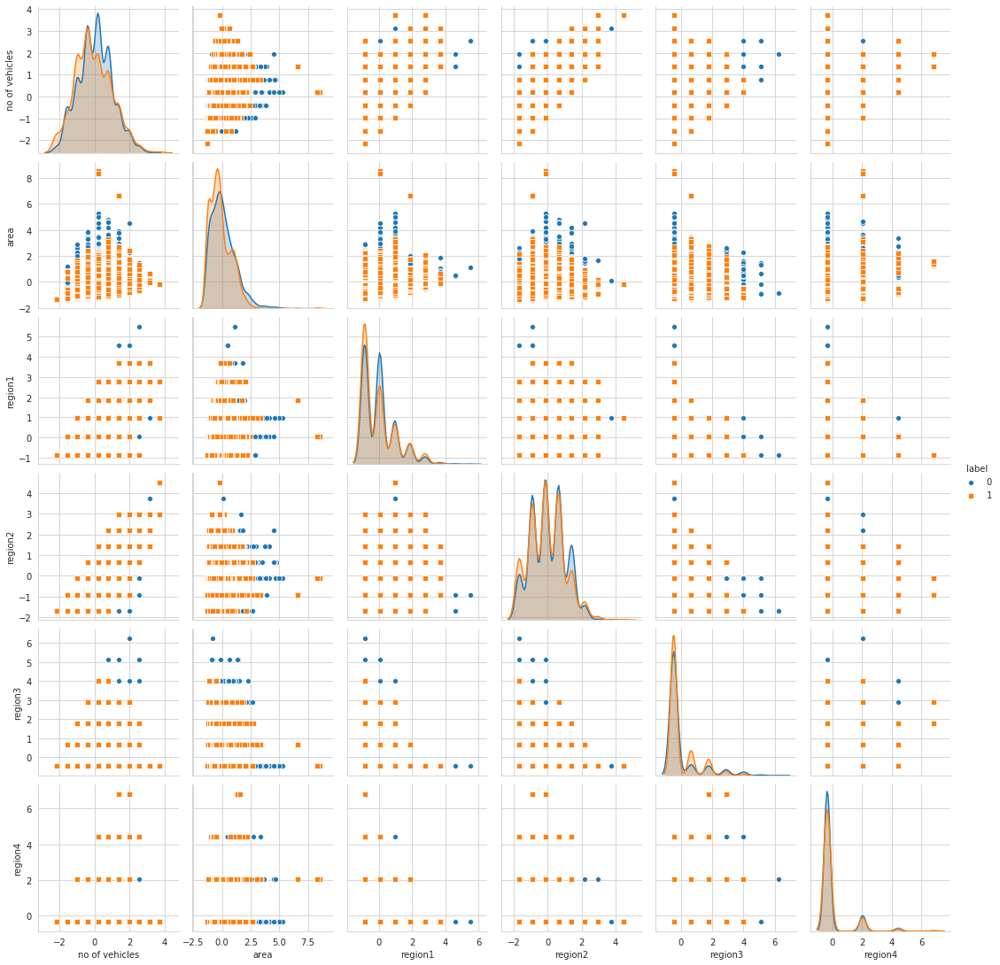

In [15]:
# f1 = features_train_scaled.copy()
# f1['label'] = labels_df_train['safe/unsafe'].values

# import seaborn as sns
# sns.set_style("whitegrid")
# sns.pairplot(f1, hue='label',vars = ['no of vehicles','area','region1','region2','region3','region4'], markers=["o", "s"])
# plt.show()